# Analytics Vidya Hackathon Computer Vision June-2020

Link: https://datahack.analyticsvidhya.com/contest/janatahack-computer-vision-hackathon/

Team:
- Praveen Raghuvanshi
- Suman Kanukollu

### References
- [How to Train an Image Classifier in PyTorch and use it to Perform Basic Inference on Single Images](
https://towardsdatascience.com/how-to-train-an-image-classifier-in-pytorch-and-use-it-to-perform-basic-inference-on-single-images-99465a1e9bf5)



# Setup

In [1]:
import torch
from IPython.display import Image, clear_output 

print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.5.0+cu101 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [2]:
# Load data from Google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
import sys,os

homepath = '/content/drive/My Drive/jantahackathon/data'
os.chdir(homepath)

!ls

full  images  jantahackathon.pth  test	test.csv  train.csv  train_SOaYf6m.zip


# Install Extensions

In [4]:
!pip install ipython-autotime
%load_ext autotime

  Created wheel for ipython-autotime: filename=ipython_autotime-0.1-cp36-none-any.whl size=1832 sha256=3b3b9f8dbaf532ea8b33995258f638343bbcad834aba743126bd40278d932f58
  Stored in directory: /root/.cache/pip/wheels/d2/df/81/2db1e54bc91002cec40334629bc39cfa86dff540b304ebcd6e
Successfully built ipython-autotime


# Constants, import libraries

In [5]:
import torch,torchvision
from torchvision.datasets import ImageFolder
from PIL import Image

import pandas as pd
import numpy as np


time: 399 ms


# Albumentations

In [6]:
import albumentations as alb
from albumentations.pytorch import ToTensor
class album_compose_train:
    def __init__(self):
        #meandata, stddata=album_calculate_dataset_mean_std()
        mean_color=(0.4804, 0.4482, 0.3976)
        #channel_mean=(meandata[0]+meandata[1]+meandata[2])/3.0
        #print('channel mean',channel_mean)
        self.albtransform = alb.Compose([
                #alb.PadIfNeeded(min_height=80, min_width=80, border_mode=cv2.BORDER_CONSTANT, value=np.array(mean_color)*255),
                #alb.RandomCrop(64,64,always_apply=True),
                #alb.Rotate((-30.0,30.0)),
                #alb.ToGray(),
                #alb.RandomBrightnessContrast(),
                alb.HorizontalFlip(p=0.5),
                #alb.RandomResizedCrop(64, 64, scale=(0.75, 1.0), ratio=(0.9, 1.1), p=0.75),
                #alb.Cutout(num_holes=4,max_h_size=16, max_w_size=16,fill_value=0.4421*255),
                #alb.CoarseDropout(max_holes=8, max_height=16, max_width=16, min_holes=1, min_height=8, min_width=8,fill_value=0, p=1.0),
                #alb.Normalize((0.4804, 0.4482, 0.3976), (0.277, 0.269, 0.282)),
                ToTensor(),
        ])
 
    def __call__(self,img):
        img=np.array(img)
        img=self.albtransform(image=img)
        return img['image']

class album_compose_test:
    def __init__(self):
        #meandata, stddata=album_calculate_dataset_mean_std()
        self.albtransform = alb.Compose([
        
        #print('meandata[0]:',meandata[0]),
        alb.Normalize((0.4804, 0.4482, 0.3976), (0.277, 0.269, 0.282)),
        ToTensor(),
        ])
 
    def __call__(self,img):
        img=np.array(img)
        img=self.albtransform(image=img)
        return img['image']



time: 1.6 s


# Dataset read

In [7]:
class emgNemgDs(torch.utils.data.Dataset,album_compose_train,album_compose_test):
    def __init__(self,train=True):
        self.path,self.trainFn, self.testFn = os.path.join(homepath,'images'),'train.csv','test.csv'
        self.train = train
        if self.train:
            self.ds = pd.read_csv('train.csv').to_numpy()
        else:
            self.ds  = pd.read_csv('test.csv').to_numpy()
        self.transform = album_compose_train()
        #self.testnames = []

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        img_name = os.path.join(self.path, self.ds[idx][0])
        image = Image.open(img_name)
        image = self.transform(image)
        if self.train:
            labels = self.ds[idx][1]
            return image,labels
        else:
            #self.testnames.append(img_name)
            #self.testDict = {'image_names':self.testnames ,'emergency_or_not':[]}
            return image

        

time: 20 ms


In [8]:
trainDs = emgNemgDs(train=True)
testDs  = emgNemgDs(train=False)
print('Train DS length is : {}\nTest DS length is : {}'.format(len(trainDs),len(testDs)))


Train DS length is : 1646
Test DS length is : 706
time: 1.29 s


In [9]:
from torch.utils.data import random_split
train_ds,val_ds = random_split(trainDs,[1235,411])

print('Dataset is splitted into 75%+25%:\n\ttrain_ds len is : {}\n\tval_ds len is : {}'.format(len(train_ds),len(val_ds)))

Dataset is splitted into 75%+25%:
	train_ds len is : 1235
	val_ds len is : 411
time: 18.7 ms


# Dataloader

In [10]:
from torch.utils.data import DataLoader,random_split

SEED = 1
# For reproducibility
torch.manual_seed(SEED)

torch.cuda.manual_seed(SEED)

train_loader = DataLoader(train_ds, batch_size = 16, shuffle =True, pin_memory=True,num_workers =0)
val_loader  = DataLoader(val_ds, batch_size = 8, shuffle =False, pin_memory=True,num_workers =0)

test_loader = DataLoader(testDs,batch_size = 8, shuffle =False, pin_memory=True,num_workers =0)

time: 9.06 ms


# Display images

In [ ]:
import torchvision
from matplotlib import pyplot as plt

def show(imgs,lbls=None, figsize=(100,100), *args, **kwargs):
    grid_tensor = torchvision.utils.make_grid(imgs[:8], *args, **kwargs)
    grid_image = grid_tensor.permute(1,2,0)
    plt.figtext(100,100,'suman')
    plt.figure(figsize=figsize)
    plt.imshow(grid_image)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    if lbls is not None:
        print(' '.join('%22s' % [lbls[j]] for j in range(8)))
    plt.close()


time: 10.1 ms


<Figure size 432x288 with 0 Axes>

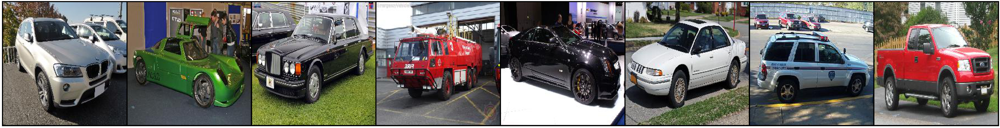

           [tensor(0)]            [tensor(0)]            [tensor(0)]            [tensor(1)]            [tensor(0)]            [tensor(0)]            [tensor(0)]            [tensor(0)]
time: 34.7 s


In [ ]:
dataiter = iter(train_loader)
img,lbl = dataiter.next()

show(img,lbl)

<Figure size 432x288 with 0 Axes>

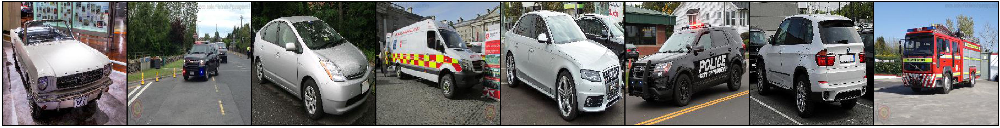

time: 4.94 s


In [ ]:
dataiter = iter(test_loader)
img = dataiter.next()

show(img)

In [ ]:
'''# Constants
TEST_CSV = '/content/drive/My Drive/jantahackathon/data/test_vc2kHdQ.csv'

TRAIN_CSV = '/content/drive/My Drive/jantahackathon/data/train.csv'
TOTAL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/full'
TOTAL_IMAGES_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/emergency'
TOTAL_IMAGES_NOT_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/notemergency'
TRAIN_ZIP = '/content/drive/My Drive/jantahackathon/data/train_SOaYf6m.zip'
ALL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/images'

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch

from skimage.io import imread
from tqdm import tqdm

%matplotlib inline

# for creating validation set
from sklearn.model_selection import train_test_split

# PyTorch libraries and modules
import torch
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, MaxPool2d, Module, Softmax, BatchNorm2d, Dropout
from torch.optim import Adam, SGD
from torch import nn
from torch import optim
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms, models
from torch.utils.data.sampler import SubsetRandomSampler

print(len(os.listdir(TOTAL_IMAGES_EMERGENCY_PATH)))
print(len(os.listdir(TOTAL_IMAGES_NOT_EMERGENCY_PATH)))
'''

"# Constants\nTEST_CSV = '/content/drive/My Drive/jantahackathon/data/test_vc2kHdQ.csv'\n\nTRAIN_CSV = '/content/drive/My Drive/jantahackathon/data/train.csv'\nTOTAL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/full'\nTOTAL_IMAGES_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/emergency'\nTOTAL_IMAGES_NOT_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/notemergency'\nTRAIN_ZIP = '/content/drive/My Drive/jantahackathon/data/train_SOaYf6m.zip'\nALL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/images'\n\nimport os\nimport pandas as pd\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport torch\n\nfrom skimage.io import imread\nfrom tqdm import tqdm\n\n%matplotlib inline\n\n# for creating validation set\nfrom sklearn.model_selection import train_test_split\n\n# PyTorch libraries and modules\nimport torch\nfrom torch.autograd import Variable\nfrom torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, Max

time: 6.31 ms


# Model

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.resnet50(pretrained=True)
print(model)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1,

### Freeze and modify final layer

In [12]:
for param in model.parameters():
    param.requires_grad = False
    

model.fc = torch.nn.Sequential(torch.nn.Linear(2048, 512),
                            torch.nn.ReLU(),
                            torch.nn.Dropout(0.2),
                            torch.nn.Linear(512, 2),
                            torch.nn.LogSoftmax(dim=1))

time: 23.2 ms


## Loss and Optimizer

In [13]:
criterion = torch.nn.NLLLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=0.003)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

time: 8.46 s


# Train Model

In [15]:
from tqdm import tqdm

epochs = 20
steps = 0
running_loss = 0
best_accuracy = 0
print_every = 10
train_losses, test_losses = [], []
for epoch in tqdm(range(epochs)):
    for inputs, labels in train_loader:
        steps += 1
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        logps = model.forward(inputs)
        loss = criterion(logps, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        if steps % print_every == 0:
            test_loss = 0
            accuracy = 0
            model.eval()
            with torch.no_grad():
                for inputs, labels in val_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    logps = model.forward(inputs)
                    batch_loss = criterion(logps, labels)
                    test_loss += batch_loss.item()
                    
                    ps = torch.exp(logps)
                    top_p, top_class = ps.topk(1, dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    accuracy += torch.mean(equals.type(torch.FloatTensor)).item()
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))     
            test_accuracy = accuracy/len(val_loader)               
            print(f"Epoch {epoch+1}/{epochs}.. "
                  f"Train loss: {running_loss/print_every:.3f}.. "
                  f"Test loss: {test_loss/len(val_loader):.3f}.. "
                  f"Test accuracy: {accuracy/len(val_loader):.3f}")
            running_loss = 0

            # Save best model
            if test_accuracy > best_accuracy:
              best_accuracy = test_accuracy
              print(f'Saving best model with accuracy: {best_accuracy:.3f`
              +yfd}')
              torch.save(model, 'jantahackathon.pth')
            model.train()

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20.. Train loss: 1.410.. Test loss: 0.546.. Test accuracy: 0.765
Saving best model with accuracy: 0.7652243593564401
Epoch 1/20.. Train loss: 0.628.. Test loss: 0.261.. Test accuracy: 0.906
Saving best model with accuracy: 0.90625
Epoch 1/20.. Train loss: 0.645.. Test loss: 0.393.. Test accuracy: 0.818
Epoch 1/20.. Train loss: 0.466.. Test loss: 0.382.. Test accuracy: 0.863
Epoch 1/20.. Train loss: 0.348.. Test loss: 0.399.. Test accuracy: 0.852
Epoch 1/20.. Train loss: 0.396.. Test loss: 0.330.. Test accuracy: 0.873
Epoch 1/20.. Train loss: 0.355.. Test loss: 0.200.. Test accuracy: 0.925
Saving best model with accuracy: 0.9254807692307693


  5%|▌         | 1/20 [15:06<4:47:07, 906.71s/it]

Epoch 2/20.. Train loss: 0.397.. Test loss: 0.317.. Test accuracy: 0.863
Epoch 2/20.. Train loss: 0.207.. Test loss: 0.243.. Test accuracy: 0.909
Epoch 2/20.. Train loss: 0.272.. Test loss: 0.194.. Test accuracy: 0.933
Saving best model with accuracy: 0.9326923076923077
Epoch 2/20.. Train loss: 0.247.. Test loss: 0.351.. Test accuracy: 0.873
Epoch 2/20.. Train loss: 0.218.. Test loss: 0.193.. Test accuracy: 0.930
Epoch 2/20.. Train loss: 0.252.. Test loss: 0.204.. Test accuracy: 0.921
Epoch 2/20.. Train loss: 0.297.. Test loss: 0.219.. Test accuracy: 0.918
Epoch 2/20.. Train loss: 0.232.. Test loss: 0.187.. Test accuracy: 0.923


 10%|█         | 2/20 [16:02<3:15:24, 651.38s/it]

Epoch 3/20.. Train loss: 0.367.. Test loss: 0.247.. Test accuracy: 0.906
Epoch 3/20.. Train loss: 0.264.. Test loss: 0.223.. Test accuracy: 0.925
Epoch 3/20.. Train loss: 0.259.. Test loss: 0.551.. Test accuracy: 0.756
Epoch 3/20.. Train loss: 0.403.. Test loss: 0.228.. Test accuracy: 0.916
Epoch 3/20.. Train loss: 0.346.. Test loss: 0.204.. Test accuracy: 0.930
Epoch 3/20.. Train loss: 0.298.. Test loss: 0.197.. Test accuracy: 0.918
Epoch 3/20.. Train loss: 0.358.. Test loss: 0.187.. Test accuracy: 0.928
Epoch 3/20.. Train loss: 0.165.. Test loss: 0.166.. Test accuracy: 0.925


 15%|█▌        | 3/20 [16:56<2:13:45, 472.10s/it]

Epoch 4/20.. Train loss: 0.215.. Test loss: 0.329.. Test accuracy: 0.899
Epoch 4/20.. Train loss: 0.332.. Test loss: 0.198.. Test accuracy: 0.928
Epoch 4/20.. Train loss: 0.192.. Test loss: 0.193.. Test accuracy: 0.921
Epoch 4/20.. Train loss: 0.269.. Test loss: 0.197.. Test accuracy: 0.923
Epoch 4/20.. Train loss: 0.252.. Test loss: 0.273.. Test accuracy: 0.892
Epoch 4/20.. Train loss: 0.305.. Test loss: 0.316.. Test accuracy: 0.889
Epoch 4/20.. Train loss: 0.276.. Test loss: 0.323.. Test accuracy: 0.858
Epoch 4/20.. Train loss: 0.242.. Test loss: 0.235.. Test accuracy: 0.916


 20%|██        | 4/20 [17:49<1:32:26, 346.63s/it]

Epoch 5/20.. Train loss: 0.332.. Test loss: 0.192.. Test accuracy: 0.921
Epoch 5/20.. Train loss: 0.487.. Test loss: 0.234.. Test accuracy: 0.904
Epoch 5/20.. Train loss: 0.259.. Test loss: 0.212.. Test accuracy: 0.918
Epoch 5/20.. Train loss: 0.228.. Test loss: 0.184.. Test accuracy: 0.923
Epoch 5/20.. Train loss: 0.198.. Test loss: 0.177.. Test accuracy: 0.923
Epoch 5/20.. Train loss: 0.308.. Test loss: 0.200.. Test accuracy: 0.913
Epoch 5/20.. Train loss: 0.328.. Test loss: 0.214.. Test accuracy: 0.916


 25%|██▌       | 5/20 [18:43<1:04:41, 258.76s/it]

Epoch 5/20.. Train loss: 0.221.. Test loss: 0.205.. Test accuracy: 0.911
Epoch 6/20.. Train loss: 0.393.. Test loss: 0.180.. Test accuracy: 0.925
Epoch 6/20.. Train loss: 0.272.. Test loss: 0.294.. Test accuracy: 0.885
Epoch 6/20.. Train loss: 0.225.. Test loss: 0.177.. Test accuracy: 0.928
Epoch 6/20.. Train loss: 0.310.. Test loss: 0.276.. Test accuracy: 0.885
Epoch 6/20.. Train loss: 0.249.. Test loss: 0.219.. Test accuracy: 0.913
Epoch 6/20.. Train loss: 0.236.. Test loss: 0.174.. Test accuracy: 0.938
Saving best model with accuracy: 0.9375
Epoch 6/20.. Train loss: 0.203.. Test loss: 0.194.. Test accuracy: 0.925


 30%|███       | 6/20 [19:32<45:42, 195.91s/it]  

Epoch 7/20.. Train loss: 0.209.. Test loss: 0.173.. Test accuracy: 0.918
Epoch 7/20.. Train loss: 0.252.. Test loss: 0.168.. Test accuracy: 0.923
Epoch 7/20.. Train loss: 0.233.. Test loss: 0.185.. Test accuracy: 0.921
Epoch 7/20.. Train loss: 0.202.. Test loss: 0.170.. Test accuracy: 0.928
Epoch 7/20.. Train loss: 0.317.. Test loss: 0.190.. Test accuracy: 0.918
Epoch 7/20.. Train loss: 0.311.. Test loss: 0.217.. Test accuracy: 0.909
Epoch 7/20.. Train loss: 0.205.. Test loss: 0.204.. Test accuracy: 0.921
Epoch 7/20.. Train loss: 0.208.. Test loss: 0.176.. Test accuracy: 0.925


 35%|███▌      | 7/20 [20:26<33:13, 153.33s/it]

Epoch 8/20.. Train loss: 0.292.. Test loss: 0.169.. Test accuracy: 0.921
Epoch 8/20.. Train loss: 0.173.. Test loss: 0.173.. Test accuracy: 0.928
Epoch 8/20.. Train loss: 0.237.. Test loss: 0.205.. Test accuracy: 0.911
Epoch 8/20.. Train loss: 0.201.. Test loss: 0.165.. Test accuracy: 0.921
Epoch 8/20.. Train loss: 0.151.. Test loss: 0.160.. Test accuracy: 0.938
Epoch 8/20.. Train loss: 0.245.. Test loss: 0.172.. Test accuracy: 0.935
Epoch 8/20.. Train loss: 0.221.. Test loss: 0.192.. Test accuracy: 0.911
Epoch 8/20.. Train loss: 0.248.. Test loss: 0.156.. Test accuracy: 0.947
Saving best model with accuracy: 0.9471153846153846


 40%|████      | 8/20 [21:22<24:48, 124.02s/it]

Epoch 9/20.. Train loss: 0.264.. Test loss: 0.157.. Test accuracy: 0.935
Epoch 9/20.. Train loss: 0.320.. Test loss: 0.267.. Test accuracy: 0.899
Epoch 9/20.. Train loss: 0.311.. Test loss: 0.166.. Test accuracy: 0.930
Epoch 9/20.. Train loss: 0.245.. Test loss: 0.161.. Test accuracy: 0.935
Epoch 9/20.. Train loss: 0.247.. Test loss: 0.179.. Test accuracy: 0.928
Epoch 9/20.. Train loss: 0.153.. Test loss: 0.197.. Test accuracy: 0.923
Epoch 9/20.. Train loss: 0.372.. Test loss: 0.168.. Test accuracy: 0.925
Epoch 9/20.. Train loss: 0.344.. Test loss: 0.165.. Test accuracy: 0.930


 45%|████▌     | 9/20 [22:16<18:53, 103.03s/it]

Epoch 10/20.. Train loss: 0.211.. Test loss: 0.161.. Test accuracy: 0.930
Epoch 10/20.. Train loss: 0.237.. Test loss: 0.177.. Test accuracy: 0.928
Epoch 10/20.. Train loss: 0.244.. Test loss: 0.159.. Test accuracy: 0.928
Epoch 10/20.. Train loss: 0.178.. Test loss: 0.186.. Test accuracy: 0.923
Epoch 10/20.. Train loss: 0.187.. Test loss: 0.151.. Test accuracy: 0.935
Epoch 10/20.. Train loss: 0.339.. Test loss: 0.219.. Test accuracy: 0.897
Epoch 10/20.. Train loss: 0.174.. Test loss: 0.162.. Test accuracy: 0.925


 50%|█████     | 10/20 [23:10<14:42, 88.26s/it]

Epoch 10/20.. Train loss: 0.229.. Test loss: 0.161.. Test accuracy: 0.935
Epoch 11/20.. Train loss: 0.229.. Test loss: 0.156.. Test accuracy: 0.928
Epoch 11/20.. Train loss: 0.253.. Test loss: 0.198.. Test accuracy: 0.916
Epoch 11/20.. Train loss: 0.212.. Test loss: 0.224.. Test accuracy: 0.892
Epoch 11/20.. Train loss: 0.202.. Test loss: 0.176.. Test accuracy: 0.925
Epoch 11/20.. Train loss: 0.219.. Test loss: 0.150.. Test accuracy: 0.933
Epoch 11/20.. Train loss: 0.189.. Test loss: 0.169.. Test accuracy: 0.930
Epoch 11/20.. Train loss: 0.178.. Test loss: 0.163.. Test accuracy: 0.935


 55%|█████▌    | 11/20 [23:59<11:27, 76.43s/it]

Epoch 12/20.. Train loss: 0.251.. Test loss: 0.148.. Test accuracy: 0.940
Epoch 12/20.. Train loss: 0.167.. Test loss: 0.177.. Test accuracy: 0.921
Epoch 12/20.. Train loss: 0.181.. Test loss: 0.164.. Test accuracy: 0.925
Epoch 12/20.. Train loss: 0.266.. Test loss: 0.154.. Test accuracy: 0.942
Epoch 12/20.. Train loss: 0.181.. Test loss: 0.194.. Test accuracy: 0.918
Epoch 12/20.. Train loss: 0.149.. Test loss: 0.193.. Test accuracy: 0.918
Epoch 12/20.. Train loss: 0.213.. Test loss: 0.201.. Test accuracy: 0.918
Epoch 12/20.. Train loss: 0.128.. Test loss: 0.143.. Test accuracy: 0.940


 60%|██████    | 12/20 [24:53<09:17, 69.70s/it]

Epoch 13/20.. Train loss: 0.106.. Test loss: 0.182.. Test accuracy: 0.930
Epoch 13/20.. Train loss: 0.220.. Test loss: 0.152.. Test accuracy: 0.938
Epoch 13/20.. Train loss: 0.187.. Test loss: 0.235.. Test accuracy: 0.913
Epoch 13/20.. Train loss: 0.233.. Test loss: 0.145.. Test accuracy: 0.938
Epoch 13/20.. Train loss: 0.188.. Test loss: 0.175.. Test accuracy: 0.916
Epoch 13/20.. Train loss: 0.214.. Test loss: 0.148.. Test accuracy: 0.935
Epoch 13/20.. Train loss: 0.276.. Test loss: 0.162.. Test accuracy: 0.935
Epoch 13/20.. Train loss: 0.253.. Test loss: 0.153.. Test accuracy: 0.930


 65%|██████▌   | 13/20 [25:47<07:35, 65.12s/it]

Epoch 14/20.. Train loss: 0.284.. Test loss: 0.154.. Test accuracy: 0.940
Epoch 14/20.. Train loss: 0.224.. Test loss: 0.146.. Test accuracy: 0.938
Epoch 14/20.. Train loss: 0.160.. Test loss: 0.164.. Test accuracy: 0.928
Epoch 14/20.. Train loss: 0.135.. Test loss: 0.165.. Test accuracy: 0.940
Epoch 14/20.. Train loss: 0.313.. Test loss: 0.186.. Test accuracy: 0.913
Epoch 14/20.. Train loss: 0.262.. Test loss: 0.143.. Test accuracy: 0.938
Epoch 14/20.. Train loss: 0.200.. Test loss: 0.167.. Test accuracy: 0.925
Epoch 14/20.. Train loss: 0.238.. Test loss: 0.193.. Test accuracy: 0.918


 70%|███████   | 14/20 [26:42<06:12, 62.06s/it]

Epoch 15/20.. Train loss: 0.385.. Test loss: 0.187.. Test accuracy: 0.933
Epoch 15/20.. Train loss: 0.209.. Test loss: 0.159.. Test accuracy: 0.921
Epoch 15/20.. Train loss: 0.225.. Test loss: 0.153.. Test accuracy: 0.923
Epoch 15/20.. Train loss: 0.182.. Test loss: 0.200.. Test accuracy: 0.921
Epoch 15/20.. Train loss: 0.213.. Test loss: 0.153.. Test accuracy: 0.940
Epoch 15/20.. Train loss: 0.318.. Test loss: 0.154.. Test accuracy: 0.930
Epoch 15/20.. Train loss: 0.225.. Test loss: 0.163.. Test accuracy: 0.930


 75%|███████▌  | 15/20 [27:36<04:58, 59.67s/it]

Epoch 15/20.. Train loss: 0.327.. Test loss: 0.175.. Test accuracy: 0.928
Epoch 16/20.. Train loss: 0.219.. Test loss: 0.180.. Test accuracy: 0.923
Epoch 16/20.. Train loss: 0.185.. Test loss: 0.163.. Test accuracy: 0.923
Epoch 16/20.. Train loss: 0.236.. Test loss: 0.158.. Test accuracy: 0.935
Epoch 16/20.. Train loss: 0.285.. Test loss: 0.156.. Test accuracy: 0.933
Epoch 16/20.. Train loss: 0.213.. Test loss: 0.161.. Test accuracy: 0.935
Epoch 16/20.. Train loss: 0.178.. Test loss: 0.156.. Test accuracy: 0.930
Epoch 16/20.. Train loss: 0.143.. Test loss: 0.171.. Test accuracy: 0.930


 80%|████████  | 16/20 [28:25<03:45, 56.45s/it]

Epoch 17/20.. Train loss: 0.158.. Test loss: 0.166.. Test accuracy: 0.925
Epoch 17/20.. Train loss: 0.159.. Test loss: 0.156.. Test accuracy: 0.933
Epoch 17/20.. Train loss: 0.243.. Test loss: 0.225.. Test accuracy: 0.899
Epoch 17/20.. Train loss: 0.310.. Test loss: 0.204.. Test accuracy: 0.916
Epoch 17/20.. Train loss: 0.245.. Test loss: 0.200.. Test accuracy: 0.913
Epoch 17/20.. Train loss: 0.195.. Test loss: 0.170.. Test accuracy: 0.925
Epoch 17/20.. Train loss: 0.285.. Test loss: 0.169.. Test accuracy: 0.923
Epoch 17/20.. Train loss: 0.233.. Test loss: 0.175.. Test accuracy: 0.923


 85%|████████▌ | 17/20 [29:19<02:47, 55.71s/it]

Epoch 18/20.. Train loss: 0.324.. Test loss: 0.334.. Test accuracy: 0.852
Epoch 18/20.. Train loss: 0.194.. Test loss: 0.313.. Test accuracy: 0.880
Epoch 18/20.. Train loss: 0.263.. Test loss: 0.164.. Test accuracy: 0.930
Epoch 18/20.. Train loss: 0.208.. Test loss: 0.153.. Test accuracy: 0.938
Epoch 18/20.. Train loss: 0.202.. Test loss: 0.186.. Test accuracy: 0.916
Epoch 18/20.. Train loss: 0.243.. Test loss: 0.146.. Test accuracy: 0.930
Epoch 18/20.. Train loss: 0.230.. Test loss: 0.162.. Test accuracy: 0.935
Epoch 18/20.. Train loss: 0.128.. Test loss: 0.162.. Test accuracy: 0.935


 90%|█████████ | 18/20 [30:13<01:50, 55.26s/it]

Epoch 19/20.. Train loss: 0.221.. Test loss: 0.170.. Test accuracy: 0.928
Epoch 19/20.. Train loss: 0.180.. Test loss: 0.162.. Test accuracy: 0.935
Epoch 19/20.. Train loss: 0.178.. Test loss: 0.167.. Test accuracy: 0.921
Epoch 19/20.. Train loss: 0.128.. Test loss: 0.170.. Test accuracy: 0.940
Epoch 19/20.. Train loss: 0.199.. Test loss: 0.176.. Test accuracy: 0.918
Epoch 19/20.. Train loss: 0.217.. Test loss: 0.163.. Test accuracy: 0.928
Epoch 19/20.. Train loss: 0.195.. Test loss: 0.145.. Test accuracy: 0.938
Epoch 19/20.. Train loss: 0.206.. Test loss: 0.159.. Test accuracy: 0.938


 95%|█████████▌| 19/20 [31:08<00:54, 54.97s/it]

Epoch 20/20.. Train loss: 0.257.. Test loss: 0.184.. Test accuracy: 0.921
Epoch 20/20.. Train loss: 0.184.. Test loss: 0.162.. Test accuracy: 0.938
Epoch 20/20.. Train loss: 0.310.. Test loss: 0.137.. Test accuracy: 0.930
Epoch 20/20.. Train loss: 0.147.. Test loss: 0.168.. Test accuracy: 0.938
Epoch 20/20.. Train loss: 0.197.. Test loss: 0.166.. Test accuracy: 0.930
Epoch 20/20.. Train loss: 0.188.. Test loss: 0.208.. Test accuracy: 0.897
Epoch 20/20.. Train loss: 0.197.. Test loss: 0.146.. Test accuracy: 0.935


100%|██████████| 20/20 [32:02<00:00, 96.14s/it]

Epoch 20/20.. Train loss: 0.157.. Test loss: 0.144.. Test accuracy: 0.935
time: 32min 2s


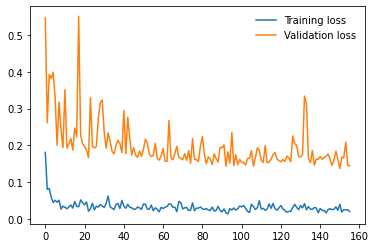

time: 240 ms


In [17]:
from matplotlib import pyplot as plt

plt.plot(train_losses, label='Training loss')
plt.plot(test_losses, label='Validation loss')
plt.legend(frameon=False)
plt.show()

# Load the saved model wts

In [18]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model=torch.load('jantahackathon.pth')
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

time: 246 ms


In [19]:
from torchvision import transforms
test_transforms = transforms.Compose([transforms.ToTensor(),
                                      #transforms.Normalize([0.485, 0.456, 0.406],
                                      #                     [0.229, 0.224, 0.225])
                                     ])

time: 1.28 ms


In [20]:
from torch.autograd import Variable

def predict_image(image):
    image_tensor = test_transforms(image).float()
    image_tensor = image_tensor.unsqueeze_(0)
    input = Variable(image_tensor)
    #input = image
    input = input.to(device)
    output = model(input)
    index = output.data.cpu().numpy().argmax()
    return index

time: 3.59 ms


In [21]:
def get_random_images(num):
    #data = datasets.ImageFolder(data_dir, transform=test_transforms)
    #classes = data.classes
    indices = list(range(len(val_ds)))
    np.random.shuffle(indices)
    idx = indices[:num]
    from torch.utils.data.sampler import SubsetRandomSampler
    sampler = SubsetRandomSampler(idx)
    #loader = torch.utils.data.DataLoader(data, 
    #               sampler=sampler, batch_size=num)
    dataiter = iter(val_loader)
    images, labels = dataiter.next()
    return images, labels

time: 4.55 ms


# Validate Model 

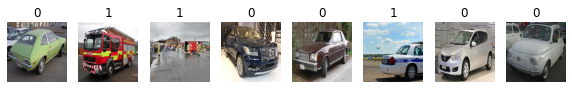

time: 629 ms


In [22]:
from matplotlib import pyplot as plt

to_pil = torchvision.transforms.ToPILImage()
images, labels = get_random_images(5)
fig=plt.figure(figsize=(10,10))
for ii in range(len(images)):
    image = to_pil(images[ii])
    index = predict_image(image)
    #print(index)
    sub = fig.add_subplot(1, len(images), ii+1)
    res = int(labels[ii]) == index
    if res:
        sub.set_title(index)
    else:
        print('Misclassified Image :\n\tActual Label : {} and predicted : {}'.format(int(labels[ii]),index))
    plt.axis('off')
    plt.imshow(image)
plt.show()

# Test model

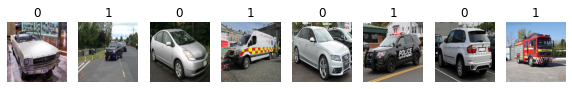

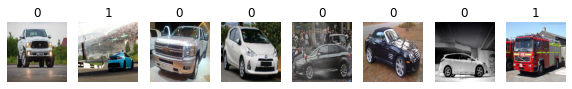

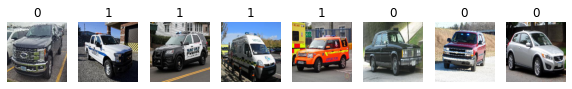

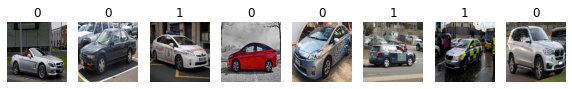

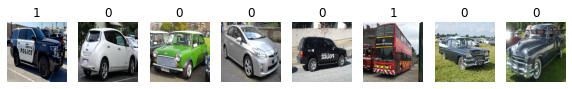

...

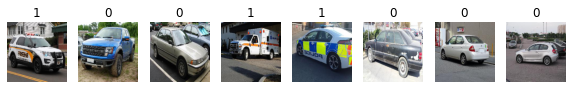

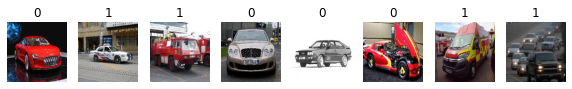

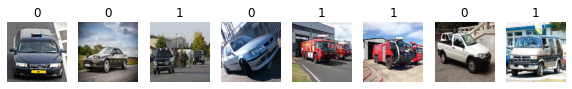

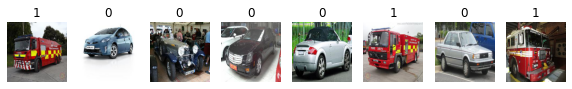

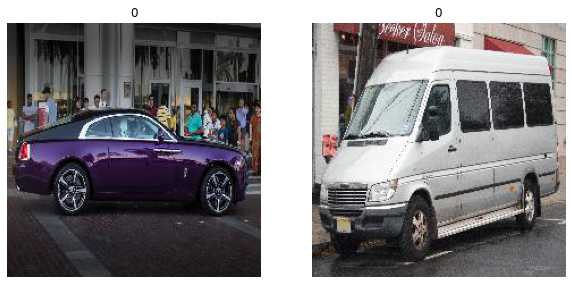


time: 7min 34s


In [24]:
from matplotlib import pyplot as plt
predClass = []

#for _ in np.arange(float(len(testDs))/8.0+1): 
data = iter(test_loader)
#for v in np.arange(float(len(testDs))/8.0+1): 
res = True
while res:
    try:
        images = data.next()
        res = False if len(images)==0 else True
    except Exception as e:
        print(str(e))
        break
    to_pil = torchvision.transforms.ToPILImage()


    fig=plt.figure(figsize=(10,10))
    for ii in range(len(images)):
        image = to_pil(images[ii])
        index = predict_image(image)
        predClass.append(index)
        sub = fig.add_subplot(1, len(images), ii+1)
        sub.set_title(index)
        plt.axis('off')
        plt.imshow(image)
    plt.show()

In [25]:
sample = pd.DataFrame(testDs.ds,columns=['image_names'])
sample['emergency_or_not'] = np.array(predClass)

time: 5.86 ms


In [26]:
sample.to_csv('sample_2.csv',index=False)

time: 93 ms


In [27]:
sample

,image_names,emergency_or_not
0,1960.jpg,0
1,668.jpg,1
2,2082.jpg,0
3,808.jpg,1
4,1907.jpg,0
...,...,...
701,674.jpg,1
702,1027.jpg,0
703,447.jpg,1
704,2176.jpg,0


time: 32.4 ms
